# Detectron2 Beginner's Tutorial

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

Welcome to detectron2! This is the official colab tutorial of detectron2. Here, we will go through some basics usage of detectron2, including the following:
* Run inference on images or videos, with an existing detectron2 model
* Train a detectron2 model on a new dataset

You can make a copy of this tutorial by "File -> Open in playground mode" and make changes there. __DO NOT__ request access to this tutorial.


# Install detectron2

In [1]:
# !python -m pip install pyyaml==5.1
# import sys, os, distutils.core
# # Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# # See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
# !git clone 'https://github.com/facebookresearch/detectron2'
# dist = distutils.core.run_setup("./detectron2/setup.py")
# !python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
# sys.path.insert(0, os.path.abspath('./detectron2'))

# # Properly install detectron2. (Please do not install twice in both ways)
# # !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

In [2]:
import sys
print(sys.executable)

/trunk2/yufei/anaconda3/envs/detectron/bin/python


In [3]:
import numpy as np
m = np.zeros(3)
m

array([0., 0., 0.])

In [4]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2017 NVIDIA Corporation
Built on Fri_Nov__3_21:07:56_CDT_2017
Cuda compilation tools, release 9.1, V9.1.85
torch:  1.10 ; cuda:  1.10.0
detectron2: 0.6


/trunk2/yufei/anaconda3/envs/detectron/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
from tqdm import tqdm
import os
import json
import cv2
import random
# from google.colab.patches import cv2_imshow
from IPython.display import display, Image
import io

def cv2_imshow(a):
    """A replacement for cv2.imshow() for use in Jupyter notebooks."""
    a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    _, buffer = cv2.imencode(".jpg", a, [int(cv2.IMWRITE_JPEG_QUALITY), 95])
    display(Image(data=buffer))

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Train on a custom dataset

In this section, we show how to train an existing detectron2 model on a custom dataset in a new format.

We use [the balloon segmentation dataset](https://github.com/matterport/Mask_RCNN/tree/master/samples/balloon)
which only has one class: balloon.
We'll train a balloon segmentation model from an existing model pre-trained on COCO dataset, available in detectron2's model zoo.

Note that COCO dataset does not have the "balloon" category. We'll be able to recognize this new class in a few minutes.

## Prepare the dataset

Register the balloon dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).
Here, the dataset is in its custom format, therefore we write a function to parse it and prepare it into detectron2's standard format. User should write such a function when using a dataset in custom format. See the tutorial for more details.


In [6]:
height, width = cv2.imread("/trunk/shared/pair_data/A36588/00013.000.001.tif").shape[:2]
print(height, width)

3874 4594


In [7]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")
from pathlib import Path
import os
import cv2
import json
import glob
from detectron2.structures import BoxMode

def find_image_file(base_path, file_name_without_extension):
    # Define the possible image extensions
    image_extensions = ['.jpg', '.png', '.JPG', '.tif']
    
    # Search for image files with the specified base name and extensions
    for extension in image_extensions:
        # Build the path for the image file
        image_path = os.path.join(base_path, file_name_without_extension + extension)
        if os.path.exists(image_path):
            return image_path  # Return the image path if file exists

    return None  # If no image file is found

def process_annotations(annotations):
    objs = []
    for anno in annotations:
        px = [point[0] for point in anno['polygon']]
        py = [point[1] for point in anno['polygon']]
        poly = [(x, y) for x, y in zip(px, py)]
        poly_flatten = [p for x in poly for p in x]

        obj = {
            "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
            "bbox_mode": BoxMode.XYXY_ABS,
            "segmentation": [poly_flatten],
            "category_id": 0,  # Assuming you have only one category
            "confidence": anno['confidence']
        }
        objs.append(obj)
    return objs

def get_custom_dicts(json_dir, image_dir):
    print("json_dir: ", json_dir)
    print("image_dir: ", image_dir)
    dataset_dicts = []
    json_files = list(Path(json_dir).rglob('*.json'))  # Get the list of JSON files

    # Use tqdm to show a progress bar
    for json_file_path in tqdm(json_files, desc='Processing JSON files'):
        with open(str(json_file_path), 'r') as f:
            annotations_data = json.load(f)
        
        record = {}
        file_name_without_extension = json_file_path.stem

        # Build the path to the image by using the base image directory and the image filename
        image_file = find_image_file(image_dir, file_name_without_extension)
        if image_file is None:
            print(f"No image found for {json_file_path.name}, skipping.")
            continue
        
        # Read image to get its width and height
        image = cv2.imread(image_file)
        height, width = image.shape[:2]

        # Create the record dict
        record["file_name"] = image_file
        record["image_id"] = file_name_without_extension
        record["height"] = height
        record["width"] = width

        # Process the annotations
        record["annotations"] = process_annotations(annotations_data)
        dataset_dicts.append(record)
    
    return dataset_dicts

# Usage
# img_dir = "/trunk2/yufei/datasets/jsons"
# base_path = '/trunk2/yufei/datasets/pictures/'
# dataset_dicts = get_custom_dicts(img_dir, base_path)

# Assuming your directories are named "train", "val", and "test" under "/trunk2/yufei/datasets/pictures/"
# for d in ["train", "val", "test"]:
for d in ["train", "validation"]:
    DatasetCatalog.register("my_dataset_" + d, lambda d=d: get_custom_dicts(f"/trunk2/yufei/summer24/EEBO_page_extraction/dataset/jsons/{d}", f"/trunk2/yufei/summer24/EEBO_page_extraction/dataset/pictures/{d}"))
    MetadataCatalog.get("my_dataset_" + d).set(thing_classes=["my_class"])

# Now you have metadata for each of the splits
train_metadata = MetadataCatalog.get("my_dataset_train")
val_metadata = MetadataCatalog.get("my_dataset_validation")
# test_metadata = MetadataCatalog.get("my_dataset_test")



To verify the dataset is in correct format, let's visualize the annotations of randomly selected samples in the training set:



json_dir:  /trunk2/yufei/summer24/EEBO_page_extraction/dataset/jsons/train
image_dir:  /trunk2/yufei/summer24/EEBO_page_extraction/dataset/pictures/train


Processing JSON files: 100%|██████████| 77/77 [00:03<00:00, 19.83it/s]

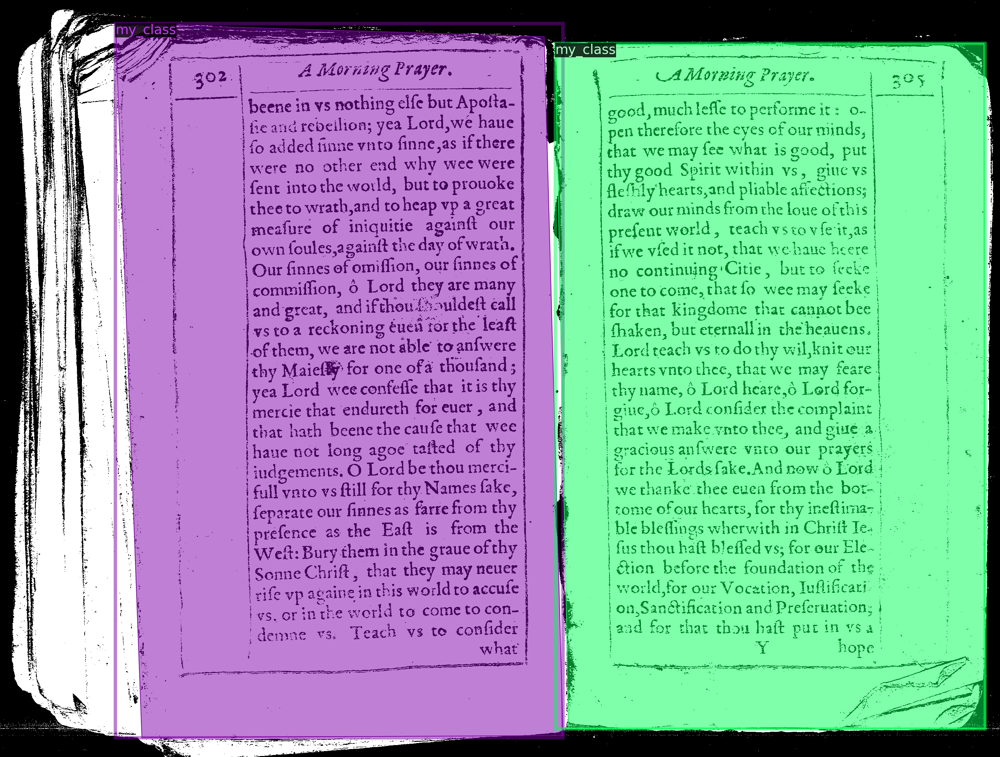

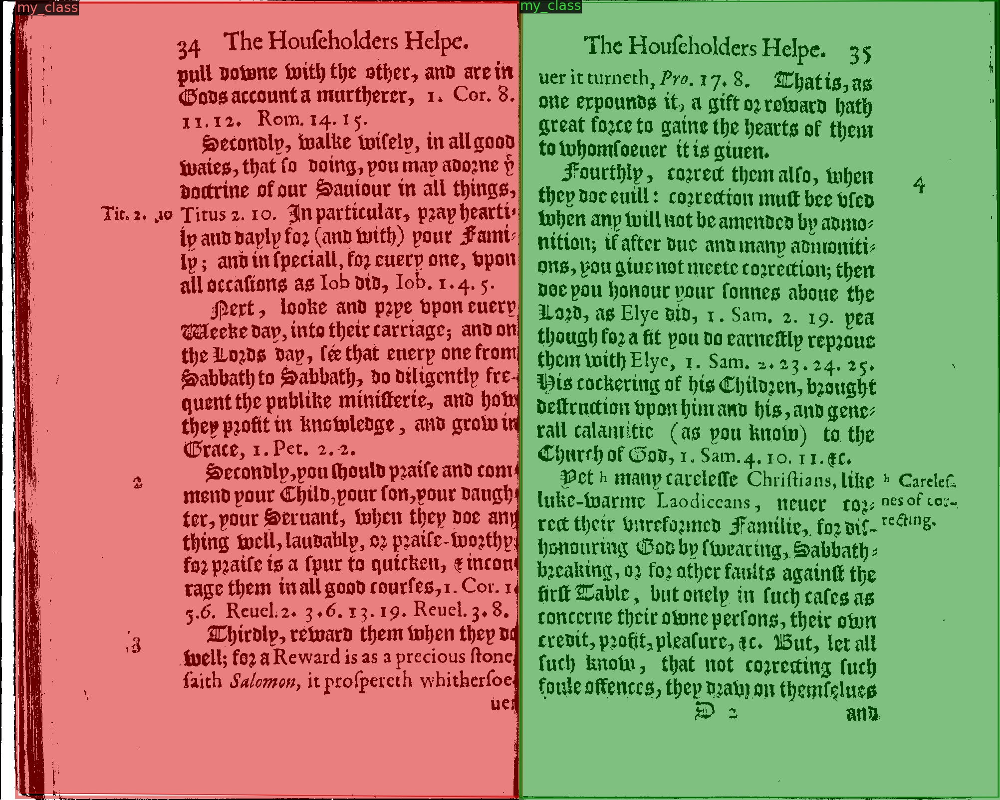

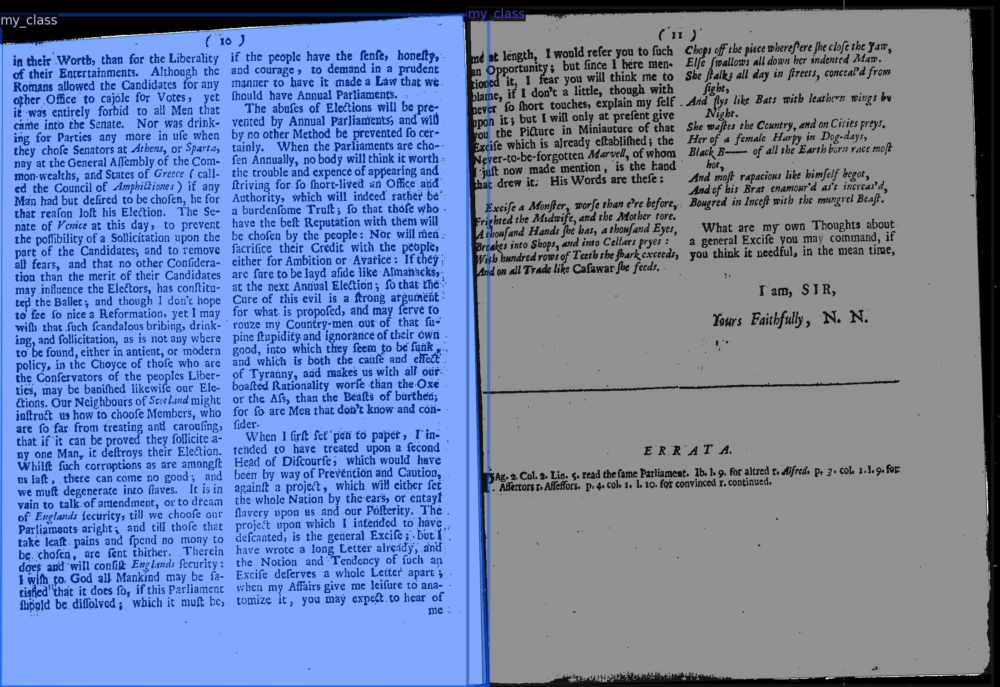

In [8]:
# Usage
img_dir = "/trunk2/yufei/summer24/EEBO_page_extraction/dataset/jsons/train"
base_path = '/trunk2/yufei/summer24/EEBO_page_extraction/dataset/pictures/train'
dataset_dicts = get_custom_dicts(img_dir, base_path)

# dataset_dicts = get_custom_dicts(f"/trunk2/yufei/datasets/jsons/train", f"/trunk2/yufei/datasets/pictures/train")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

## Train!

Now, let's fine-tune a COCO-pretrained R50-FPN Mask R-CNN model on the balloon dataset. It takes ~2 minutes to train 300 iterations on a P100 GPU.


In [9]:
from detectron2.engine import DefaultTrainer
print(torch.cuda.device_count(), "GPUs")
trainFlag = False
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 8 # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 500    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

if trainFlag:
    os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
    trainer = DefaultTrainer(cfg)
    trainer.resume_or_load(resume=False)
    trainer.train()

4 GPUs


In [10]:
# # Look at training curves in tensorboard:
# %load_ext tensorboard
# %tensorboard --logdir output

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [11]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.75   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

Then, we randomly select several samples to visualize the prediction results.

In [12]:
import json
import numpy as np
import cv2
import torch
from pathlib import Path

# Function to save the prediction outputs to JSON files
def save_text_line_to_json(outputs, image_path, output_dir):
    """Converts prediction output to a JSON format and saves it to a file."""
    os.makedirs(output_dir, exist_ok=True)  # Ensure the output directory exists

    # Initialize the record dictionary to store image text_line
    record = {
        "img_size": outputs['instances'].image_size,
        "text_line": []
    }

    # Extract relevant data from the outputs
    boxes = outputs['instances'].pred_boxes.tensor.cpu().numpy()
    scores = outputs['instances'].scores.cpu().numpy()
    classes = outputs['instances'].pred_classes.cpu().numpy()

    if outputs['instances'].has('pred_masks'):
        # Convert binary masks to boolean arrays
        masks = outputs['instances'].pred_masks.cpu().numpy()

    # Iterate over each instance prediction
    for idx in range(len(scores)):
        # Create a list to store all points from all contours of the current mask
        all_points = []

        if outputs['instances'].has('pred_masks'):
            mask = masks[idx].astype('uint8')
            contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            
            # Iterate over all contours and extend the all_points list with points from each contour
            for contour in contours:
                # Flatten the contour array and extend all_points
                all_points.extend(contour.squeeze(axis=1).tolist())

        record['text_line'].append({
            "confidence": float(scores[idx]),
            "polygon": all_points  # Use the flattened list of points
        })

    # Construct file path to save the JSON data
    base_name = Path(image_path).stem
    json_file_name = f"{base_name}.json"
    json_path = os.path.join(output_dir, json_file_name)

    # Write data to JSON file
    with open(json_path, 'w') as f:
        json.dump(record, f, indent=4)
    
    print(f"text_line saved to {json_path}")
    return json_path

json_dir:  /trunk2/yufei/summer24/EEBO_page_extraction/dataset/jsons/validation
image_dir:  /trunk2/yufei/summer24/EEBO_page_extraction/dataset/pictures/validation


Processing JSON files: 100%|██████████| 3/3 [00:00<00:00, 51.19it/s]
/trunk2/yufei/anaconda3/envs/detectron/lib/python3.8/site-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/trunk2/yufei/anaconda3/envs/detectron/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  /opt/conda/conda-bld/pytorch_1634272068694/work/aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


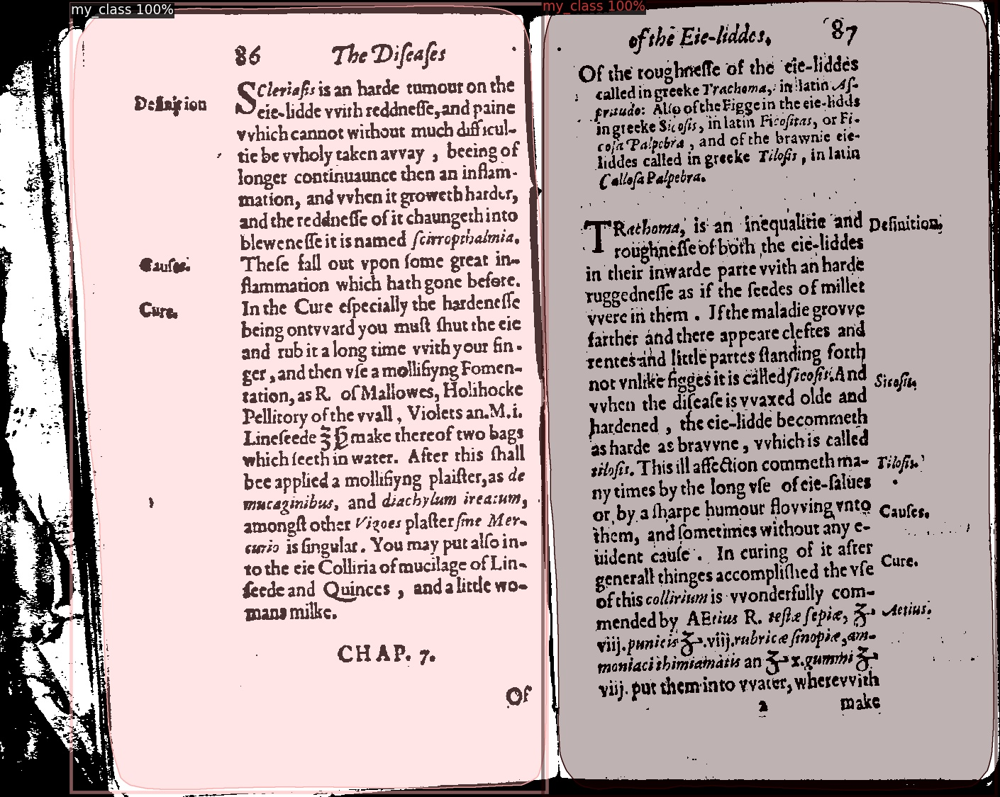

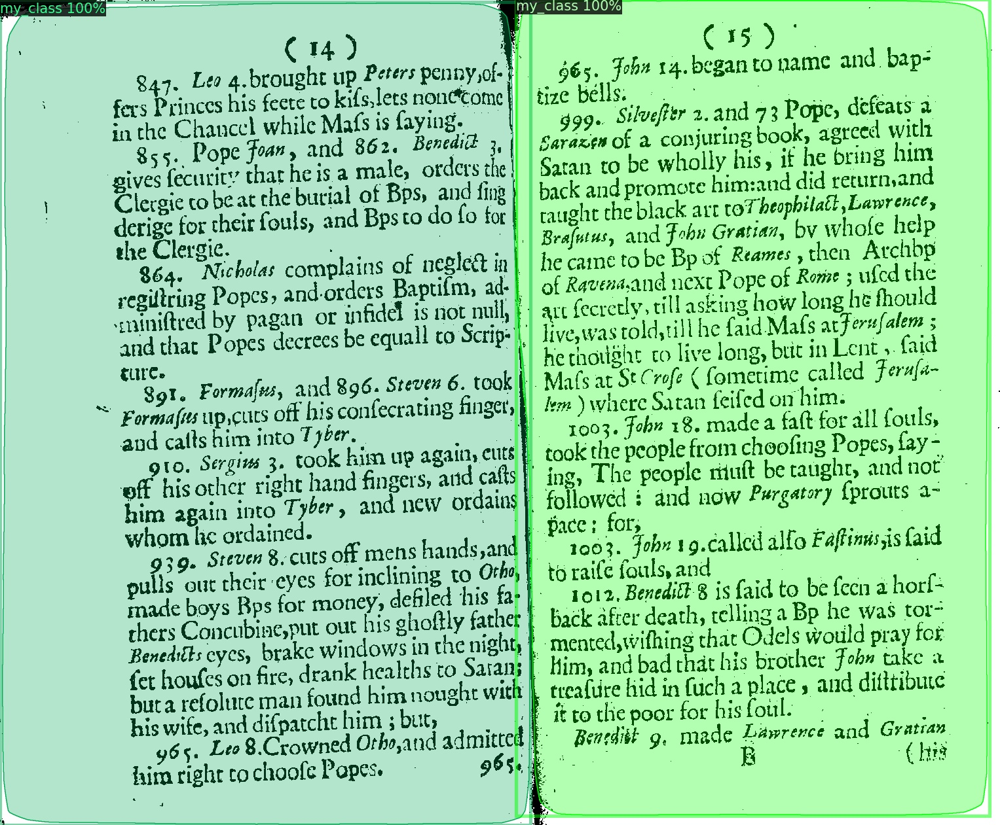

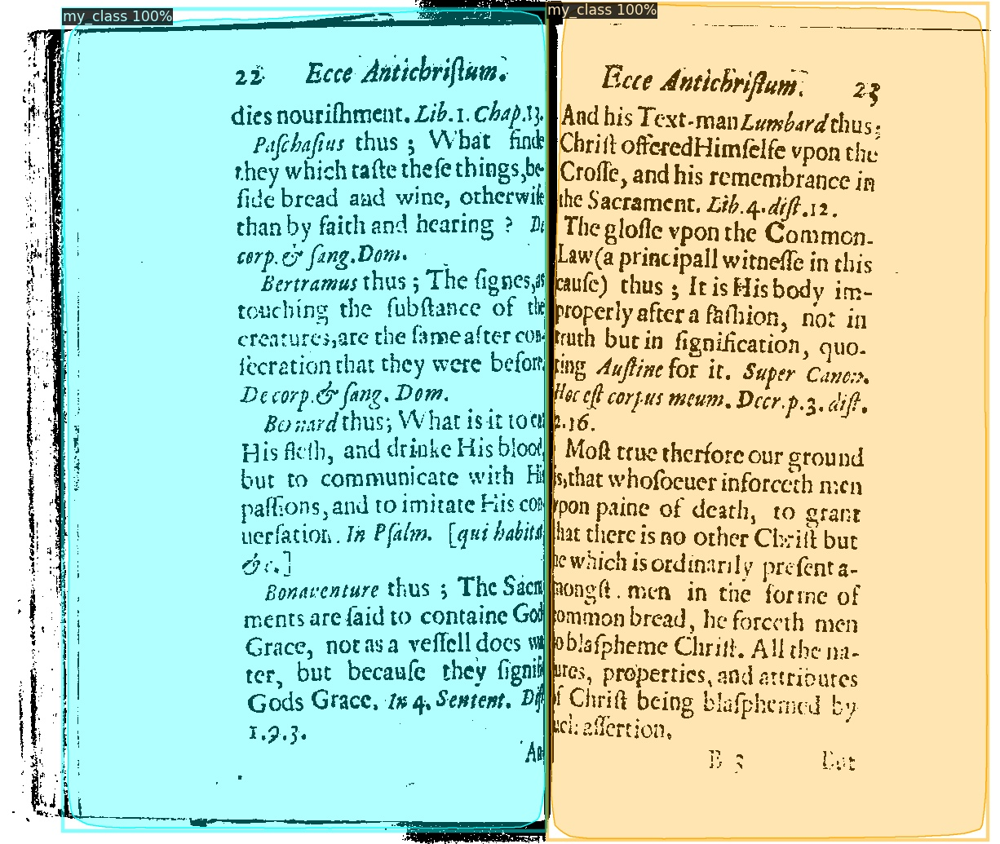

done


In [14]:
from detectron2.utils.visualizer import ColorMode
img_dir = '/trunk2/yufei/summer24/EEBO_page_extraction/dataset/jsons/validation'
base_path = "/trunk2/yufei/summer24/EEBO_page_extraction/dataset/pictures/validation"
dataset_dicts = get_custom_dicts(img_dir, base_path)
# dataset_dicts = get_custom_dicts("balloon/val")
for d in dataset_dicts:
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=train_metadata,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])
print("done")

In [15]:
# Get a list of all tif files in the directory
source_directory = "/trunk3/shared/datasets/EEBO"
tif_files = [os.path.join(source_directory, f) for f in os.listdir(source_directory) if f.endswith('.tif')]
print(tif_files[0])

/trunk3/shared/datasets/EEBO/A35216_00118.000.001.tif


In [16]:
# from detectron2.utils.visualizer import ColorMode
# # dataset_dicts = get_custom_dicts("balloon/val")

# im = cv2.imread("/trunk/shared/pair_data/A00001/00002.000.001.tif")
# outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
# v = Visualizer(im[:, :, ::-1],
#             metadata=train_metadata,
#             scale=0.5,
#             instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
# )
# out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
# cv2_imshow(out.get_image()[:, :, ::-1])
# print(outputs)

# # Save the predictions to a JSON file
# output_dict = outputs["instances"].get_fields()
# output_json = {
#     "pred_boxes": output_dict["pred_boxes"].tensor.tolist(),
#     "scores": output_dict["scores"].tolist(),
#     "pred_classes": output_dict["pred_classes"].tolist()
# }

# # Specify the output JSON file path
# json_output_path = "/trunk2/yufei/summer24/EEBO_page_extraction/output_predictions.json"

# # Write the output to the JSON file
# with open(json_output_path, 'w') as json_file:
#     json.dump(output_json, json_file, indent=4)

# print(f"Output saved to {json_output_path}")
# print(outputs)

# # Assuming dataset_dicts is already defined and filled
# json_img_record = {}
# for d in dataset_dicts:
#     im = cv2.imread(d["file_name"])
#     outputs = predictor(im)
    
#     # Save the outputs to JSON
#     save_name_json = save_text_line_to_json(outputs, d["file_name"], output_dir)
#     json_img_record[save_name_json] = d["file_name"]
# json.dump(json_img_record, open("json_img_path_mapping.json", "w"))

['/trunk3/shared/datasets/EEBO/A26553_00052.000.001.tif']
[0.9994497895240784, 0.9988264441490173]


/trunk2/yufei/anaconda3/envs/detectron/lib/python3.8/site-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


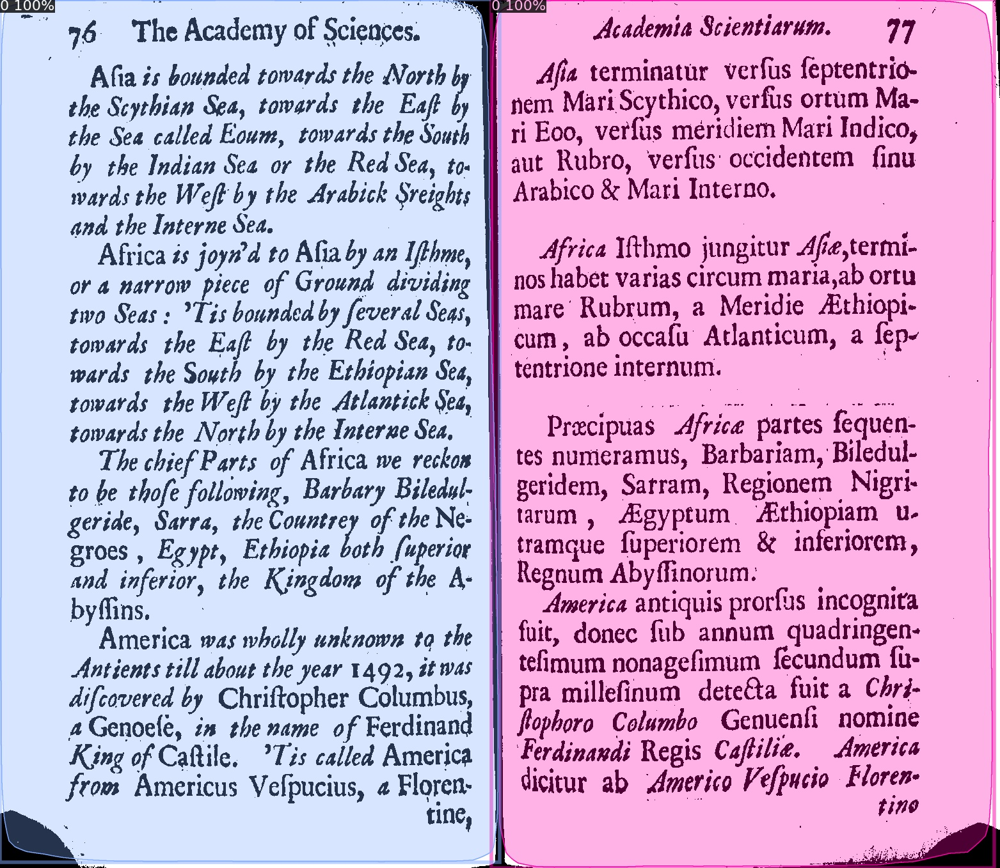

In [25]:
# Randomly select two tif files
selected_files = random.sample(tif_files, 1)
print(selected_files)

for file_name in selected_files:
    # Read the image
    image_path = os.path.join(source_directory, file_name)
    im = cv2.imread(image_path)

    # Make predictions
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    scores = outputs['instances'].scores.tolist()
    print(scores)

    # Visualize the predictions
    v = Visualizer(im[:, :, ::-1],
                   metadata=None,  # Change this to your metadata if available
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

We can also evaluate its performance using AP metric implemented in COCO API.
This gives an AP of ~70. Not bad! （Yufei's code ends here.）

In [30]:
# sample low confidence img
sample = False
if sample:
    # Randomly select 100 tif files
    selected_files = random.sample(tif_files, 500)

    # Directory to save low confidence images
    low_confidence_directory = "/trunk2/yufei/summer24/EEBO_page_extraction/low_confidence/threshold_0.7"
    os.makedirs(low_confidence_directory, exist_ok=True)

    # List to store the names of images with low confidence boxes
    low_confidence_images = []

    for file_path in selected_files:
        # Read the image
        im = cv2.imread(file_path)

        # Make predictions
        outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format

        # Check if there are any boxes with score less than 0.90
        low_confidence = any(score < 0.90 for score in outputs["instances"].scores)
        
        if low_confidence:
            # Visualize the predictions
            v = Visualizer(im[:, :, ::-1],
                        metadata=None,  # Change this to your metadata if available
                        scale=0.5,
                        instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
            )
            out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
            
            # Save the visualized image to low confidence directory
            image_name = os.path.basename(file_path)
            new_image_name = image_name.replace('.tif', '_visualized.png')
            save_path = os.path.join(low_confidence_directory, new_image_name)
            cv2.imwrite(save_path, out.get_image()[:, :, ::-1])
            low_confidence_images.append(new_image_name)
            print(f"Saved low confidence image {file_path} as {save_path}")

    # Save the names of low confidence images to a JSON file
    json_output_path = "/trunk2/yufei/summer24/EEBO_page_extraction/low_confidence_images.json"
    with open(json_output_path, 'w') as json_file:
        json.dump(low_confidence_images, json_file, indent=4)

    print(f"Low confidence images saved to {json_output_path}")

Saved low confidence image /trunk3/shared/datasets/EEBO/A35961_00058.000.001.tif as /trunk2/yufei/summer24/EEBO_page_extraction/low_confidence/threshold_0.7/A35961_00058.000.001_visualized.png
Saved low confidence image /trunk3/shared/datasets/EEBO/A03448_00792.000.001.tif as /trunk2/yufei/summer24/EEBO_page_extraction/low_confidence/threshold_0.7/A03448_00792.000.001_visualized.png
Saved low confidence image /trunk3/shared/datasets/EEBO/A70800_00061.000.001.tif as /trunk2/yufei/summer24/EEBO_page_extraction/low_confidence/threshold_0.7/A70800_00061.000.001_visualized.png
Saved low confidence image /trunk3/shared/datasets/EEBO/A53720_00294.000.001.tif as /trunk2/yufei/summer24/EEBO_page_extraction/low_confidence/threshold_0.7/A53720_00294.000.001_visualized.png
Saved low confidence image /trunk3/shared/datasets/EEBO/A68202_00261.000.001.tif as /trunk2/yufei/summer24/EEBO_page_extraction/low_confidence/threshold_0.7/A68202_00261.000.001_visualized.png
Saved low confidence image /trunk3/

[ERROR:0@2062.712] global loadsave.cpp:478 imread_ imread_('/trunk3/shared/datasets/EEBO/A68462_00001.000.001.tif'): can't read data: OpenCV(4.9.0) /io/opencv/modules/imgcodecs/src/grfmt_tiff.cpp:775: error: (-2:Unspecified error) in function 'virtual bool cv::TiffDecoder::readData(cv::Mat&)'
> buffer_size is too large: >= 1Gb (expected: 'src_buffer_size < MAX_TILE_SIZE'), where
>     'src_buffer_size' is 85600000000
> must be less than
>     'MAX_TILE_SIZE' is 1073741824



AttributeError: 'NoneType' object has no attribute 'shape'

In [29]:
import os

# Directory paths
low_confidence_directory = "/trunk2/yufei/summer24/EEBO_page_extraction/low_confidence/threshold_0.7"
output_file_path = "/trunk2/yufei/summer24/EEBO_page_extraction/test_list.txt"

# Open the output file
with open(output_file_path, 'w') as output_file:
    # Iterate over all files in the directory
    for file_name in os.listdir(low_confidence_directory):
        # Check if the file is an image (e.g., PNG)
        if file_name.endswith('.png'):
            # Construct the original file path
            original_file_name = file_name.replace('_visualized.png', '.tif')
            original_file_path = f"/trunk3/shared/datasets/EEBO/{original_file_name}"
            # Write the original file path to the output file
            output_file.write(original_file_path + '\n')

print(f"Original image paths written to {output_file_path}")


Original image paths written to /trunk2/yufei/summer24/EEBO_page_extraction/test_list.txt


In [37]:
import os
import json
import random
import cv2
import torch
from detectron2.utils.visualizer import Visualizer, ColorMode

def filter_boxes(pred_boxes, scores, pred_classes, im, rule="default"):
    """
    Apply filtering rules to the predicted boxes.
    
    Args:
        pred_boxes (Boxes): Predicted bounding boxes.
        scores (Tensor): Scores for the predicted bounding boxes.
        pred_classes (Tensor): Predicted classes for the bounding boxes.
        im (ndarray): The input image.
        rule (str): The rule to apply for filtering. Default is "default".
    
    Returns:
        filtered_boxes (Boxes): Filtered bounding boxes.
        filtered_scores (Tensor): Scores for the filtered bounding boxes.
        filtered_classes (Tensor): Classes for the filtered bounding boxes.
    """
    scores_np = scores.cpu().numpy()  # Convert scores to numpy array
    if rule == "default":
        if len(scores_np) >= 3:
            # Keep the top 2 highest scores
            top_indices = torch.argsort(scores)[-2:]  # Get the top 2 indices
            pred_boxes = pred_boxes[top_indices]
            scores = scores[top_indices]
            pred_classes = pred_classes[top_indices]
        elif len(scores_np) == 2:
            if scores_np.min() > 0.97 and (pred_boxes.area().sum() > (im.shape[0] * im.shape[1])) and (pred_boxes[0].intersection(pred_boxes[1]).area() < (im.shape[0] * im.shape[1] / 3)):
                pass  # Keep both boxes
            else:
                return None, None, None  # Skip this image
        elif len(scores_np) == 1:
            if scores_np[0] > 0.97:
                pass  # Keep this box
            else:
                return None, None, None  # Skip this image
        else:
            return None, None, None  # Skip if no boxes

    return pred_boxes, scores, pred_classes

# Define paths
source_directory = "/trunk3/shared/datasets/EEBO"
test_list_path = "/trunk2/yufei/summer24/EEBO_page_extraction/test_list.txt"
output_directory = "/trunk2/yufei/summer24/EEBO_page_extraction/iterative_learning"
low_confidence_images = []

# Load test list
with open(test_list_path, 'r') as file:
    test_files = [line.strip() for line in file]

# Make sure the output directory exists
os.makedirs(output_directory, exist_ok=True)

# Iterate over all files in the test list
for file_path in test_files:
    # Read the image
    im = cv2.imread(file_path)

    # Make predictions
    outputs = predictor(im)

    # Extract predictions
    pred_boxes = outputs['instances'].pred_boxes
    scores = outputs['instances'].scores
    pred_classes = outputs['instances'].pred_classes

    # Apply filtering rules
    filtered_boxes, filtered_scores, filtered_classes = filter_boxes(pred_boxes, scores, pred_classes, im)

    if filtered_boxes is None:
        continue  # Skip this image if no boxes passed the filter

    # Visualize the predictions
    v = Visualizer(im[:, :, ::-1],
                   metadata=train_metadata,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    
    # Construct output file path
    output_file_name = os.path.basename(file_path).replace('.tif', '_visualized.png')
    output_file_path = os.path.join(output_directory, output_file_name)

    # Save the visualization
    cv2.imwrite(output_file_path, out.get_image()[:, :, ::-1])

    # Add the image path to the list of low confidence images
    low_confidence_images.append(file_path)

    print(f"Processed and saved: {output_file_path}")

# Save the list of processed image paths to a JSON file
json_output_path = os.path.join(output_directory, "processed_images.json")
with open(json_output_path, 'w') as json_file:
    json.dump(low_confidence_images, json_file, indent=4)

print(f"Processed images list saved to {json_output_path}")


Processed and saved: /trunk2/yufei/summer24/EEBO_page_extraction/iterative_learning/A70807_00074.000.001_visualized.png
Processed and saved: /trunk2/yufei/summer24/EEBO_page_extraction/iterative_learning/A34525_00001.000.001_visualized.png
Processed and saved: /trunk2/yufei/summer24/EEBO_page_extraction/iterative_learning/A21218_00056.000.001_visualized.png
Processed and saved: /trunk2/yufei/summer24/EEBO_page_extraction/iterative_learning/A19610_00038.000.001_visualized.png
Processed and saved: /trunk2/yufei/summer24/EEBO_page_extraction/iterative_learning/A80192_00173.000.001_visualized.png


KeyboardInterrupt: 